In [1]:
# def install_reqs():
#   !pip install pandas
#   !pip install "matplotlib>=3.4"
#   !pip install numpy
#   !pip install statsmodels
#   !pip install scipy
# # install_reqs()

In [2]:
# import sys
# if "google.colab" in sys.modules:
#   !git clone -b docs https://github.com/YosefLab/Compass.git --depth 1
#   !cp -r Compass/notebooks/extdata ./
#   !cp /home/lpeiwen/Compass/notebooks/compass_analysis.py /home/lpeiwen/compass/macro-CCL2/compass_analysis.py
#   !rm -r /content/Compass
#   install_reqs()

In [3]:
cluster = 't_Tact-XIST'

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from compass_analysis import cohens_d, wilcoxon_test, get_reaction_consistencies, get_metareactions, labeled_reactions, amino_acid_metab

In [5]:
from matplotlib import __version__ as matplotlibversion
if matplotlibversion < "3.4":
    print("Matplotlib versions older than 3.4 may not be able to generate figure 2E, as they do not support alpha arrays")

In [6]:
reaction_penalties = pd.read_csv("data/"+cluster+"_reaction.tsv", sep="\t", index_col = 0)

In [7]:
reaction_penalties

,NR_E_cluster_0,NR_E_cluster_1,NR_E_cluster_2,NR_E_cluster_3,NR_E_cluster_4,NR_E_cluster_5,NR_E_cluster_6,NR_E_cluster_7,NR_E_cluster_8,NR_E_cluster_9,...,non-NR_E_cluster_182,non-NR_E_cluster_183,non-NR_E_cluster_184,non-NR_E_cluster_185,non-NR_E_cluster_186,non-NR_E_cluster_187,non-NR_E_cluster_188,non-NR_E_cluster_189,non-NR_E_cluster_190,non-NR_E_cluster_191
10FTHF5GLUtl_pos,3608.694140,4021.714473,3536.210337,3799.004517,4411.386112,3498.973510,3696.236768,3717.815094,4590.205411,3914.076701,...,3861.836077,3501.863707,3500.230640,3752.574218,3600.940687,3434.113156,3518.016983,3537.737361,3556.821022,4000.788576
10FTHF5GLUtm_pos,5116.960958,5144.810555,4846.467992,5188.898819,6320.596796,4945.304788,6083.891841,5194.444751,6210.095768,4945.838648,...,5976.841672,5002.835869,4939.208921,5198.717352,5821.872241,4964.061641,4982.828893,4931.760685,4980.577313,5382.514614
10FTHF6GLUtl_pos,4257.938908,4894.021852,4140.490459,4564.252572,5547.070173,4079.733238,4399.439164,4432.310228,5826.565818,4671.404526,...,4665.812596,4086.290305,4084.594254,4493.289699,4247.144684,3976.502994,4114.279780,4150.592429,4177.484790,4888.738140
10FTHF6GLUtm_pos,5446.886812,5477.136858,5019.939325,5530.098529,6760.826927,5157.369732,6459.665736,5529.462372,6633.370043,5154.437475,...,6308.393285,5236.097293,5149.802877,5554.612135,6049.923309,5176.169021,5211.595696,5125.312009,5205.154317,5847.287443
10FTHF7GLUtl_pos,4690.768753,5347.216326,4543.327598,5027.231943,6251.689420,4466.906390,4868.240761,4908.640317,6417.980220,5034.161320,...,5201.796941,4475.908037,4474.169997,4958.679401,4677.947348,4338.096220,4510.912404,4544.361095,4567.692358,5437.303120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sink_pre_prot(r)_pos,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
sink_tetdec2coa(c)_neg,16905.165684,17522.263620,16323.805822,15726.381866,20276.117401,16346.947099,17199.572219,16722.025594,21989.567114,19006.547713,...,19322.537440,16667.991916,16402.581262,18194.915765,17714.723587,15107.434354,15925.581607,14386.477745,17529.282563,16224.867516
sink_tetdec2coa(c)_pos,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
sink_tetdece1coa(c)_neg,16905.165684,17522.263620,16323.805822,15726.381866,20276.117401,16346.947099,17199.572219,16722.025594,21989.567114,19006.547713,...,19322.537440,16667.991916,16402.581262,18194.915765,17714.723587,15107.434354,15925.581607,14386.477745,17529.282563,16224.867516


In [8]:
NR = reaction_penalties.columns[reaction_penalties.columns.str.startswith('NR_')]

In [9]:
NR

Index(['NR_E_cluster_0', 'NR_E_cluster_1', 'NR_E_cluster_2', 'NR_E_cluster_3',
       'NR_E_cluster_4', 'NR_E_cluster_5', 'NR_E_cluster_6', 'NR_E_cluster_7',
       'NR_E_cluster_8', 'NR_E_cluster_9', 'NR_E_cluster_10',
       'NR_E_cluster_11', 'NR_E_cluster_12', 'NR_E_cluster_13',
       'NR_E_cluster_14', 'NR_E_cluster_15', 'NR_E_cluster_16',
       'NR_E_cluster_17', 'NR_E_cluster_18', 'NR_E_cluster_19',
       'NR_E_cluster_20', 'NR_E_cluster_21', 'NR_E_cluster_22',
       'NR_E_cluster_23', 'NR_E_cluster_24', 'NR_E_cluster_25',
       'NR_E_cluster_26', 'NR_E_cluster_27', 'NR_E_cluster_28',
       'NR_E_cluster_29', 'NR_E_cluster_30', 'NR_E_cluster_31',
       'NR_E_cluster_32', 'NR_E_cluster_33', 'NR_E_cluster_34',
       'NR_E_cluster_35', 'NR_E_cluster_36', 'NR_E_cluster_37',
       'NR_E_cluster_38', 'NR_E_cluster_39', 'NR_E_cluster_40',
       'NR_E_cluster_41', 'NR_E_cluster_42', 'NR_E_cluster_43',
       'NR_E_cluster_44', 'NR_E_cluster_45'],
      dtype='object')

In [10]:
R = reaction_penalties.columns[reaction_penalties.columns.str.startswith('non')]

In [11]:
R

Index(['non-NR_E_cluster_0', 'non-NR_E_cluster_1', 'non-NR_E_cluster_2',
       'non-NR_E_cluster_3', 'non-NR_E_cluster_4', 'non-NR_E_cluster_5',
       'non-NR_E_cluster_6', 'non-NR_E_cluster_7', 'non-NR_E_cluster_8',
       'non-NR_E_cluster_9',
       ...
       'non-NR_E_cluster_182', 'non-NR_E_cluster_183', 'non-NR_E_cluster_184',
       'non-NR_E_cluster_185', 'non-NR_E_cluster_186', 'non-NR_E_cluster_187',
       'non-NR_E_cluster_188', 'non-NR_E_cluster_189', 'non-NR_E_cluster_190',
       'non-NR_E_cluster_191'],
      dtype='object', length=192)

In [12]:
reaction_metadata = pd.read_csv("reaction_metadata.csv", index_col = 0)

In [13]:
reaction_metadata

,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
reaction_no_direction,,,,,,
10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...
MAL_Lte,Transport of L-malate,1.00 * (S)-malate(2-) [e] --> 1.00 * (S)-malat...,NaN,"Transport, extracellular",NaN,NaN
OROTGLUt,OROTGLUt,1.00 * L-glutamate(1-) [c] + 1.00 * Orotate [e...,SLC22A7,"Transport, extracellular",NaN,NaN
PNTOte,Transport of (R)-Pantothenate,1.00 * (R)-Pantothenate [e] --> 1.00 * (R)-Pan...,NaN,"Transport, extracellular",NaN,NaN


In [14]:
reaction_metadata.loc[['r0281']]

,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
reaction_no_direction,,,,,,
r0281,Putrescine:oxygen oxidoreductase (deaminating)...,1.00 * Water [e] + 1.00 * O2 [e] + 1.00 * Putr...,AOC1,Methionine and cysteine metabolism,1.4.3.6,0.0


In [15]:
#This function is repeated here for clarity
def get_reaction_consistencies(compass_reaction_penalties, min_range=1e-3):
    """
        Converts the raw penalties outputs of compass into scores per reactions where higher numbers indicate more activity
    """
    df = -np.log(compass_reaction_penalties + 1)
    df = df[df.max(axis=1) - df.min(axis=1) >= min_range]
    df = df - df.min().min()
    return df

In [16]:
reaction_consistencies = get_reaction_consistencies(reaction_penalties)

In [17]:
reaction_consistencies

,NR_E_cluster_0,NR_E_cluster_1,NR_E_cluster_2,NR_E_cluster_3,NR_E_cluster_4,NR_E_cluster_5,NR_E_cluster_6,NR_E_cluster_7,NR_E_cluster_8,NR_E_cluster_9,...,non-NR_E_cluster_182,non-NR_E_cluster_183,non-NR_E_cluster_184,non-NR_E_cluster_185,non-NR_E_cluster_186,non-NR_E_cluster_187,non-NR_E_cluster_188,non-NR_E_cluster_189,non-NR_E_cluster_190,non-NR_E_cluster_191
10FTHF5GLUtl_pos,3.800438,3.692104,3.820722,3.749058,3.599645,3.831305,3.776475,3.770655,3.559918,3.719226,...,3.732659,3.830480,3.830946,3.761352,3.802588,3.850011,3.825879,3.820291,3.814912,3.697319
10FTHF5GLUtm_pos,3.451304,3.445878,3.505604,3.437346,3.240089,3.485420,3.278252,3.436278,3.257723,3.485312,...,3.296001,3.473856,3.486653,3.435456,3.322267,3.481635,3.477862,3.488162,3.478314,3.400719
10FTHF6GLUtl_pos,3.635041,3.495842,3.663005,3.565587,3.370610,3.677784,3.602356,3.594914,3.321461,3.542387,...,3.543584,3.676178,3.676593,3.581253,3.637578,3.703406,3.669354,3.660569,3.654112,3.496922
10FTHF6GLUtm_pos,3.388833,3.383296,3.470444,3.373674,3.172767,3.443440,3.218328,3.373789,3.191797,3.444009,...,3.242021,3.428293,3.444908,3.369252,3.283850,3.439802,3.432983,3.449674,3.434219,3.317912
10FTHF7GLUtl_pos,3.538251,3.407297,3.570181,3.468992,3.251049,3.587141,3.501123,3.492860,3.224801,3.467615,...,3.434864,3.585128,3.585516,3.482719,3.540987,3.616394,3.577339,3.569953,3.564834,3.390593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sink_decdicoa(c)_neg,2.256382,2.220531,2.291375,2.328657,2.074568,2.289958,2.239118,2.267274,1.993447,2.139224,...,2.122737,2.270510,2.286561,2.182863,2.209608,2.368807,2.316071,2.417702,2.220131,2.297454
sink_octdececoa(c)_neg,1.891961,1.927489,2.050664,2.124195,1.715748,2.029408,1.896516,1.999227,1.629246,1.777886,...,1.815053,2.012660,2.111607,1.842713,1.906909,2.076514,1.938688,2.153985,1.881260,1.958608
sink_pre_prot(r)_neg,7.773708,7.770456,7.967412,7.863730,7.612681,7.908535,7.702427,7.956721,7.504771,7.773098,...,7.735005,7.768999,7.825233,7.742491,7.748124,7.974910,7.923863,7.942617,7.784007,7.776629
sink_tetdec2coa(c)_neg,2.256382,2.220531,2.291375,2.328657,2.074568,2.289958,2.239118,2.267274,1.993447,2.139224,...,2.122737,2.270510,2.286561,2.182863,2.209608,2.368807,2.316071,2.417702,2.220131,2.297454


In [18]:
wilcox_results = wilcoxon_test(reaction_consistencies, NR, R)
wilcox_results['metadata_r_id'] = ""
for r in wilcox_results.index:
    if r in reaction_metadata.index:
        wilcox_results.loc[r, 'metadata_r_id'] = r
    elif r[:-4] in reaction_metadata.index:
        wilcox_results.loc[r, 'metadata_r_id'] = r[:-4]
    else:
        print("Should not occur")

In [19]:
wilcox_results

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id
10FTHF5GLUtl_pos,2725.0,0.000056,-0.830464,0.000346,10FTHF5GLUtl
10FTHF5GLUtm_pos,3318.0,0.008876,-0.474933,0.016183,10FTHF5GLUtm
10FTHF6GLUtl_pos,2733.0,0.000060,-0.828493,0.000366,10FTHF6GLUtl
10FTHF6GLUtm_pos,3309.0,0.008334,-0.487825,0.015332,10FTHF6GLUtm
10FTHF7GLUtl_pos,2804.0,0.000122,-0.800244,0.000508,10FTHF7GLUtl
...,...,...,...,...,...
sink_decdicoa(c)_neg,3228.0,0.004635,-0.568418,0.008972,sink_decdicoa(c)
sink_octdececoa(c)_neg,3405.0,0.015981,-0.473433,0.027162,sink_octdececoa(c)
sink_pre_prot(r)_neg,3115.0,0.001930,-0.607406,0.004160,sink_pre_prot(r)
sink_tetdec2coa(c)_neg,3228.0,0.004635,-0.568418,0.008972,sink_tetdec2coa(c)


In [20]:
reaction_metadata

,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
reaction_no_direction,,,,,,
10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...
MAL_Lte,Transport of L-malate,1.00 * (S)-malate(2-) [e] --> 1.00 * (S)-malat...,NaN,"Transport, extracellular",NaN,NaN
OROTGLUt,OROTGLUt,1.00 * L-glutamate(1-) [c] + 1.00 * Orotate [e...,SLC22A7,"Transport, extracellular",NaN,NaN
PNTOte,Transport of (R)-Pantothenate,1.00 * (R)-Pantothenate [e] --> 1.00 * (R)-Pan...,NaN,"Transport, extracellular",NaN,NaN


In [21]:
W = wilcox_results.merge(reaction_metadata, how='left',
                         left_on='metadata_r_id', right_index=True, validate='m:1')
W

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
10FTHF5GLUtl_pos,2725.0,0.000056,-0.830464,0.000346,10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm_pos,3318.0,0.008876,-0.474933,0.016183,10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl_pos,2733.0,0.000060,-0.828493,0.000366,10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm_pos,3309.0,0.008334,-0.487825,0.015332,10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl_pos,2804.0,0.000122,-0.800244,0.000508,10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...,...,...,...,...,...
sink_decdicoa(c)_neg,3228.0,0.004635,-0.568418,0.008972,sink_decdicoa(c),"Sink for 2,6-dodecadienoylcoa(c)",1.00 * decadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_octdececoa(c)_neg,3405.0,0.015981,-0.473433,0.027162,sink_octdececoa(c),OCTDECECOASINK,1.00 * octadecenoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_pre_prot(r)_neg,3115.0,0.001930,-0.607406,0.004160,sink_pre_prot(r),glycophosphatidylinositol (GPI)-anchored prote...,1.00 * glycophosphatidylinositol (GPI)-anchore...,NaN,Exchange/demand reaction,2.4.99.9,1.0
sink_tetdec2coa(c)_neg,3228.0,0.004635,-0.568418,0.008972,sink_tetdec2coa(c),TETDEC2COASINK,1.00 * tetradecadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN


In [22]:
W = W[W['confidence'].isin([0,4])]
W = W[~W['EC_number'].isna()]
W

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
2HBO_neg,2817.0,0.000138,-0.698512,0.000542,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotina...,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
2HBO_pos,3463.0,0.023144,-0.492645,0.037936,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotina...,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
34DHOXPEGOX_pos,2939.0,0.000431,-0.653060,0.001182,34DHOXPEGOX,"3,4-Dihydroxyphenylethyleneglycol:NAD+ oxidore...",1.00 * proton [c] + 1.00 * Nicotinamide adenin...,ADH1; ADH4; ADH5; ADH6A; ADH7; ADHFE1,Tyrosine metabolism,1.1.1.1,4.0
34DHPLACOX_NADP__neg,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX_NADP_,"3,4-Dihydroxyphenylacetaldehyde:NADP+ oxidored...",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
34DHPLACOX_pos,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX,"3,4-Dihydroxyphenylacetaldehyde:NAD+ oxidoredu...",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH1A3; ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
...,...,...,...,...,...,...,...,...,...,...,...
r1467_neg,4318.5,0.816358,-0.136601,0.856991,r1467,Postulated transport reaction,1.00 * Octadecenoyl-CoA (n-C18:1CoA) [c] --> 1...,NaN,"Transport, mitochondrial",2.3.1.86,0.0
r1467_pos,3245.0,0.005257,-0.512126,0.010086,r1467,Postulated transport reaction,1.00 * Octadecenoyl-CoA (n-C18:1CoA) [c] --> 1...,NaN,"Transport, mitochondrial",2.3.1.86,0.0
r1487_pos,2979.0,0.000615,-0.633056,0.001567,r1487,EC:6.2.1.3,1.00 * ATP [r] + 1.00 * Coenzyme A [r] + 1.00 ...,ACSBG2; ACSL1; ACSL3; ACSL4; ACSL5; ACSL6; SLC...,Fatty acid oxidation,6.2.1.3,0.0
r1488_pos,3213.0,0.004142,-0.534008,0.008149,r1488,EC:6.2.1.3,1.00 * ATP [c] + 1.00 * Coenzyme A [c] + 1.00 ...,NaN,Fatty acid oxidation,6.2.1.3,0.0


In [23]:
W.loc[(W['formula'].map(lambda x: '[m]' not in x)) & (W['subsystem'] == "Citric acid cycle"), 'subsystem'] = 'Other'
W

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
2HBO_neg,2817.0,0.000138,-0.698512,0.000542,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotina...,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
2HBO_pos,3463.0,0.023144,-0.492645,0.037936,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotina...,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
34DHOXPEGOX_pos,2939.0,0.000431,-0.653060,0.001182,34DHOXPEGOX,"3,4-Dihydroxyphenylethyleneglycol:NAD+ oxidore...",1.00 * proton [c] + 1.00 * Nicotinamide adenin...,ADH1; ADH4; ADH5; ADH6A; ADH7; ADHFE1,Tyrosine metabolism,1.1.1.1,4.0
34DHPLACOX_NADP__neg,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX_NADP_,"3,4-Dihydroxyphenylacetaldehyde:NADP+ oxidored...",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
34DHPLACOX_pos,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX,"3,4-Dihydroxyphenylacetaldehyde:NAD+ oxidoredu...",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH1A3; ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
...,...,...,...,...,...,...,...,...,...,...,...
r1467_neg,4318.5,0.816358,-0.136601,0.856991,r1467,Postulated transport reaction,1.00 * Octadecenoyl-CoA (n-C18:1CoA) [c] --> 1...,NaN,"Transport, mitochondrial",2.3.1.86,0.0
r1467_pos,3245.0,0.005257,-0.512126,0.010086,r1467,Postulated transport reaction,1.00 * Octadecenoyl-CoA (n-C18:1CoA) [c] --> 1...,NaN,"Transport, mitochondrial",2.3.1.86,0.0
r1487_pos,2979.0,0.000615,-0.633056,0.001567,r1487,EC:6.2.1.3,1.00 * ATP [r] + 1.00 * Coenzyme A [r] + 1.00 ...,ACSBG2; ACSL1; ACSL3; ACSL4; ACSL5; ACSL6; SLC...,Fatty acid oxidation,6.2.1.3,0.0
r1488_pos,3213.0,0.004142,-0.534008,0.008149,r1488,EC:6.2.1.3,1.00 * ATP [c] + 1.00 * Coenzyme A [c] + 1.00 ...,NaN,Fatty acid oxidation,6.2.1.3,0.0


In [24]:
W.loc['2HBO_neg', 'formula']

'1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotinamide adenine dinucleotide [c] --> 1.00 * proton [c] + 1.00 * 2-Oxobutanoate [c] + 1.00 * Nicotinamide adenine dinucleotide - reduced [c]\nLDHA; LDHAL6B; LDHB; LDHC; UEVLD'

# Figure 2C replication

In [25]:
def plot_differential_scores(data, title, c):
    plt.figure(figsize=(12,12))
    axs = plt.gca()
    axs.scatter(data['cohens_d'], -np.log10(data['adjusted_pval']), c=c)
    axs.set_xlabel("Cohen's d", fontsize=16)
    axs.set_ylabel("-log10 (Wilcoxon-adjusted p)", fontsize=16)
    #Everything after this should be tweaked depending on your application
    axs.set_xlim(-2.2, 2.2)
    axs.axvline(0, dashes=(3,3), c='black')
    axs.axhline(1, dashes=(3,3), c='black')
    axs.set_title(title, fontdict={'fontsize':20})
    axs.annotate('', xy=(0.5, -0.08), xycoords='axes fraction', xytext=(0, -0.08),
            arrowprops=dict(arrowstyle="<-", color='red', linewidth=4))
    axs.annotate('NR_E', xy=(0.75, -0.12), xycoords='axes fraction', fontsize=16)
    axs.annotate('', xy=(0.5, -0.08), xycoords='axes fraction', xytext=(1, -0.08),
            arrowprops=dict(arrowstyle="<-", color='blue', linewidth=4))
    axs.annotate('non-NR_E', xy=(0.25, -0.12), xycoords='axes fraction', fontsize=16)
    for r in data.index:
        if r in labeled_reactions:
            x = data.loc[r, 'cohens_d']
            y = -np.log10(data.loc[r, 'adjusted_pval'])
            offset = (20, 0)
            if x < 0:
                offset = (-100, -40)
            axs.annotate(labeled_reactions[r], (x,y), xytext = offset,
                         textcoords='offset pixels', arrowprops={'arrowstyle':"-"})

In [26]:
labeled_reactions

{'PGM_neg': 'phosphoglycerate mutase (PGAM)',
 'LDH_L_neg': 'lactate dehydrogenase',
 'PDHm_pos': 'pyruvate dehydrogenase (PDH)',
 'TPI_neg': 'triosephosphate isomerase (DHAP forming)',
 'FACOAL1821_neg': 'long-chain fatty-acid-CoA ligase',
 'r1257_pos': 'long-chain fatty-acid-CoA ligase',
 'FACOAL1831_neg': 'long-chain fatty-acid-CoA ligase',
 'CSNATr_neg': 'carnitine O-acetyltransferase',
 'C160CPT1_pos': 'carnitine O-palmitoyltransferase',
 'ACONTm_pos': 'aconitate hydratase',
 'SUCOASm_pos': 'succinate-CoA ligase',
 'AKGDm_pos': 'alpha-ketoglutarate dehydrogenase',
 'SUCD1m_pos': 'succinate dehydrogenase',
 'ICDHyrm_pos': 'isocitrate dehydrogenase',
 'CK_pos': 'creatine\nkinase',
 'PGCD_pos': 'phosphoglycerate dehydrogenase',
 'ARGSS_pos': 'arginosuccinate synthase',
 'r0281_neg': 'putrescine diamine oxidase',
 'SPMDOX_pos': 'spermidine dehydrogenase (spermidine -> GABA)',
 'ARGDCm_pos': 'arginine decarboxylase',
 'AGMTm_pos': 'agmatinase',
 'GHMT2r_pos': 'serine hydroxymethyltrans

In [27]:
amino_acid_metab

['Alanine and aspartate metabolism',
 'Arginine and Proline Metabolism',
 'beta-Alanine metabolism',
 'Cysteine Metabolism',
 'D-alanine metabolism',
 'Folate metabolism',
 'Glutamate metabolism',
 'Glycine, serine, alanine and threonine metabolism',
 'Histidine metabolism',
 'Lysine metabolism',
 'Methionine and cysteine metabolism',
 'Taurine and hypotaurine metabolism',
 'Tryptophan metabolism',
 'Tyrosine metabolism',
 'Urea cycle',
 'Valine, leucine, and isoleucine metabolism']

In [28]:
np.unique(W['subsystem'])

array(['Alanine and aspartate metabolism', 'Aminosugar metabolism',
       'Androgen and estrogen synthesis and metabolism',
       'Arachidonic acid metabolism', 'Arginine and Proline Metabolism',
       'Bile acid synthesis', 'Biotin metabolism',
       'Blood group synthesis', 'Butanoate metabolism',
       'Cholesterol metabolism', 'Chondroitin sulfate degradation',
       'Citric acid cycle', 'CoA catabolism', 'CoA synthesis',
       'Cysteine Metabolism', 'Cytochrome metabolism',
       'D-alanine metabolism', 'Eicosanoid metabolism',
       'Fatty acid oxidation', 'Fatty acid synthesis',
       'Folate metabolism', 'Fructose and mannose metabolism',
       'Galactose metabolism', 'Glutamate metabolism',
       'Glutathione metabolism', 'Glycerophospholipid metabolism',
       'Glycine, serine, alanine and threonine metabolism',
       'Glycolysis/gluconeogenesis', 'Glycosphingolipid metabolism',
       'Glyoxylate and dicarboxylate metabolism', 'Heme degradation',
       'Heme s

In [29]:
filtered_data = pd.concat([W[W['subsystem'] == "Glycolysis/gluconeogenesis"],
             W[W['subsystem'] == "Citric acid cycle"],
            W[W['subsystem'].isin(amino_acid_metab)],
           W[W['subsystem'] == "Fatty acid oxidation"]])

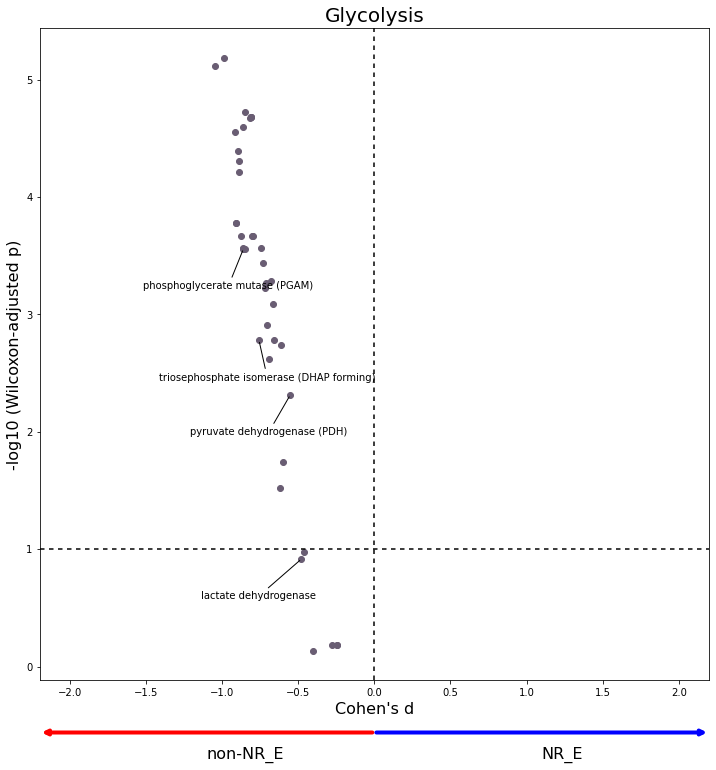

In [30]:
data = W[W['subsystem'] == "Glycolysis/gluconeogenesis"]
plot_differential_scores(data, title='Glycolysis', c="#695D73")

In [31]:
W[W['subsystem'] == "Glycolysis/gluconeogenesis"]

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
ACS_pos,2999.0,7.318237e-04,-0.614300,0.001827,ACS,acetyl-CoA synthetase,1.00 * ATP [c] + 1.00 * Coenzyme A [c] + 1.00 ...,AACS; ACSS2,Glycolysis/gluconeogenesis,6.2.1.1,4.0
ALCD2if_pos,4242.0,6.791104e-01,-0.400056,0.732199,ALCD2if,"alcohol dehydrogenase, forward rxn (ethanol ->...",1.00 * Nicotinamide adenine dinucleotide [c] +...,ADH1; ADH4; ADH5; ADH6A; ADH7; ADHFE1; ZADH2,Glycolysis/gluconeogenesis,1.1.1.1,0.0
ALCD2yf_pos,3423.0,1.796084e-02,-0.620095,0.030179,ALCD2yf,"alcohol dehydrogenase (ethanol, NADP), forward...",1.00 * Nicotinamide adenine dinucleotide phosp...,AKR1A1,Glycolysis/gluconeogenesis,1.1.1.2,0.0
ALDD2x_pos,2733.0,6.030958e-05,-0.729640,0.000366,ALDD2x,"aldehyde dehydrogenase (acetaldehyde, NAD)",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH1A1; ALDH1A2; ALDH1A3; ALDH1B1; ALDH3A1; A...,Glycolysis/gluconeogenesis,1.2.1.3,0.0
ALDD2xm_pos,2808.0,1.267067e-04,-0.676401,0.000524,ALDD2xm,"aldehyde dehydrogenase (acetylaldehyde, NAD), ...",1.00 * Water [m] + 1.00 * Nicotinamide adenine...,ALDH1B1; ALDH2,Glycolysis/gluconeogenesis,1.2.1.3,0.0
ALDD2y_pos,2692.0,3.967695e-05,-0.747528,0.000273,ALDD2y,"aldehyde dehydrogenase (acetaldehyde, NADP)",1.00 * Water [c] + 1.00 * Nicotinamide adenine...,ALDH1A2; ALDH1B1; ALDH3A1; ALDH3A2; ALDH3B1; A...,Glycolysis/gluconeogenesis,1.2.1.4,0.0
DPGM_pos,2613.0,1.725694e-05,-0.911746,0.000165,DPGM,Diphosphoglyceromutase,1.00 * 3-Phospho-D-glyceroyl phosphate [c] -->...,BPGM; PGAM1; PGAM2,Glycolysis/gluconeogenesis,5.4.2.1,0.0
DPGase_pos,2613.0,1.725694e-05,-0.911746,0.000165,DPGase,Diphosphoglycerate phosphatase,"1.00 * Water [c] + 1.00 * 2,3-bisphosphonato-D...",BPGM; PGAM1; PGAM2,Glycolysis/gluconeogenesis,5.4.2.4,0.0
ENO_neg,2458.0,3.052124e-06,-0.892371,0.000049,ENO,enolase,1.00 * D-Glycerate 2-phosphate [c] --> 1.00 * ...,ENO1; ENO2; ENO3,Glycolysis/gluconeogenesis,4.2.1.11,0.0
ENO_pos,2692.0,3.967695e-05,-0.861945,0.000273,ENO,enolase,1.00 * D-Glycerate 2-phosphate [c] --> 1.00 * ...,ENO1; ENO2; ENO3,Glycolysis/gluconeogenesis,4.2.1.11,0.0


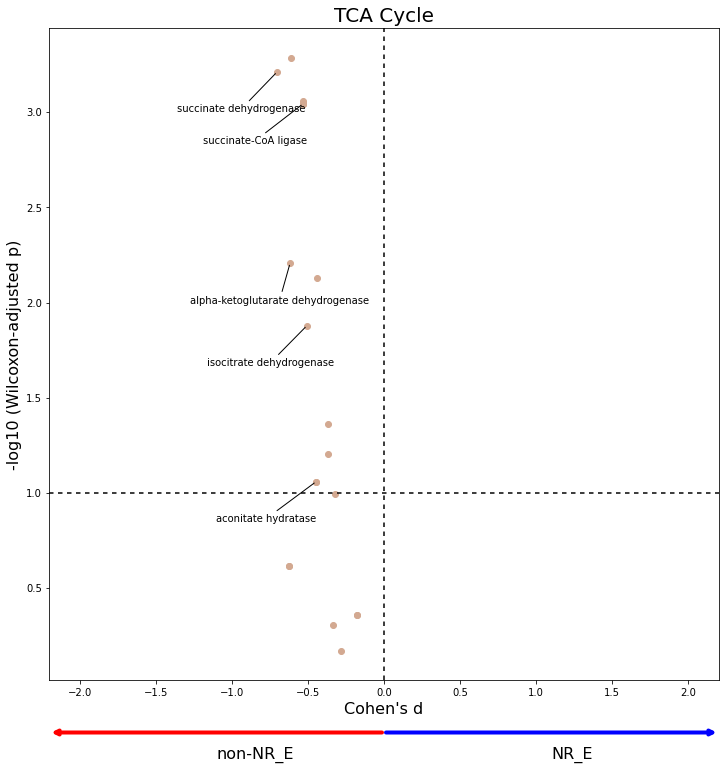

In [32]:
data = W[W['subsystem'] == "Citric acid cycle"]
plot_differential_scores(data, title="TCA Cycle", c="#D3A991")

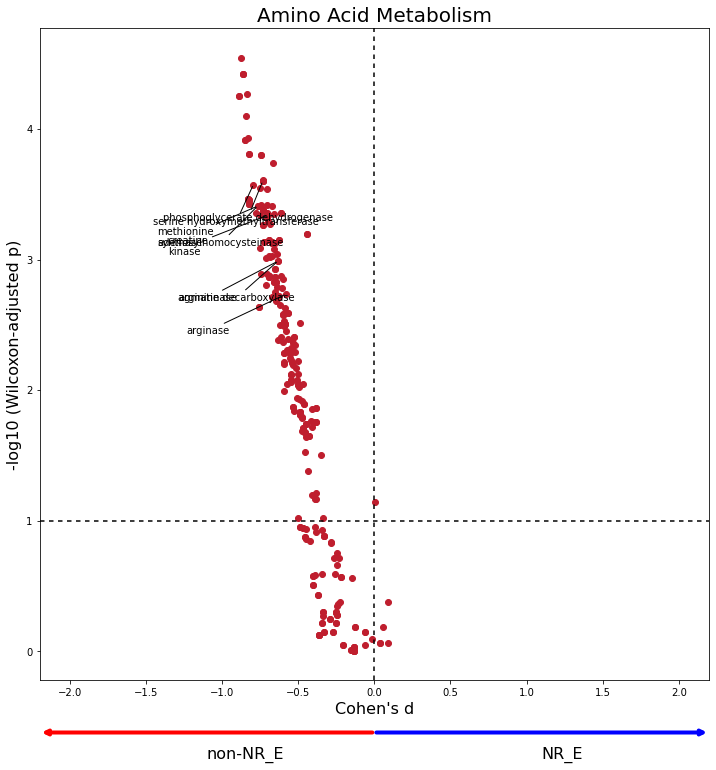

In [33]:
data = W[W['subsystem'].isin(amino_acid_metab)].copy()
data['adjusted_pval'] = data['adjusted_pval'].clip(1e-12)
plot_differential_scores(data, "Amino Acid Metabolism", c="#BF1E2E")

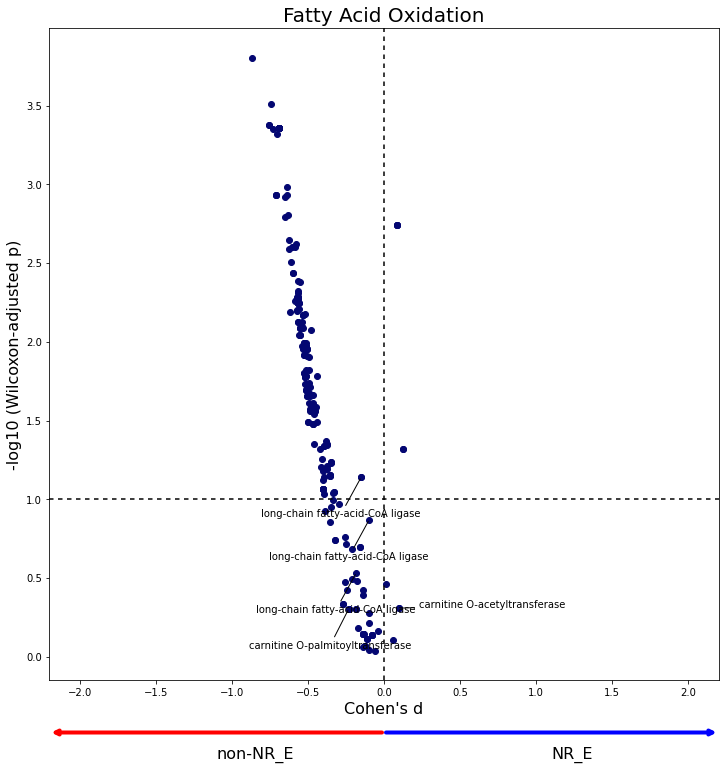

In [34]:
data = W[W['subsystem'] == "Fatty acid oxidation"]
plot_differential_scores(data, "Fatty Acid Oxidation", c="#040772")

In [35]:
W[W['subsystem'] == "Fatty acid oxidation"]

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
ACACT4p_pos,3403.0,0.015774,-0.477489,0.026894,ACACT4p,"acetyl-CoA C-acetyltransferase (octanoyl-CoA),...",1.00 * Coenzyme A [x] + 1.00 * 3-Oxodecanoyl-C...,ACAA1B,Fatty acid oxidation,2.3.1.16,4.0
ACACT5p_pos,3403.0,0.015774,-0.477489,0.026894,ACACT5p,"acetyl-CoA C-acyltransferase (decanoyl-CoA), p...",1.00 * Coenzyme A [x] + 1.00 * 3-Oxododecanoyl...,ACAA1B,Fatty acid oxidation,2.3.1.16,4.0
ACACT6p_pos,3403.0,0.015774,-0.477489,0.026894,ACACT6p,"acetyl-CoA C-acetyltransferase (dodecanoyl), p...",1.00 * Coenzyme A [x] + 1.00 * 3-Oxotetradecan...,ACAA1B,Fatty acid oxidation,2.3.1.16,4.0
ACACT7p_pos,3440.0,0.020024,-0.467178,0.033226,ACACT7p,acetyl-CoA acyltransferase (tetradecanoyl-CoA)...,1.00 * Coenzyme A [x] + 1.00 * 3-oxopalmitoyl-...,ACAA1B,Fatty acid oxidation,2.3.1.16,4.0
ACCOACm_pos,3796.0,0.139655,-0.159966,0.200974,ACCOACm,"Acetyl-Coa carboxylase, beta isoform",1.00 * Acetyl-CoA [m] + 1.00 * ATP [m] + 1.00 ...,ACACB,Fatty acid oxidation,6.4.1.2,4.0
...,...,...,...,...,...,...,...,...,...,...,...
r1449_pos,3571.0,0.044057,-0.357001,0.069448,r1449,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Tetradecanoy...,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1450_pos,3574.0,0.044814,-0.356513,0.070453,r1450,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Hexanoyl-CoA...,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1451_pos,3571.0,0.044057,-0.357001,0.069448,r1451,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Decanoyl-CoA...,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1487_pos,2979.0,0.000615,-0.633056,0.001567,r1487,EC:6.2.1.3,1.00 * ATP [r] + 1.00 * Coenzyme A [r] + 1.00 ...,ACSBG2; ACSL1; ACSL3; ACSL4; ACSL5; ACSL6; SLC...,Fatty acid oxidation,6.2.1.3,0.0


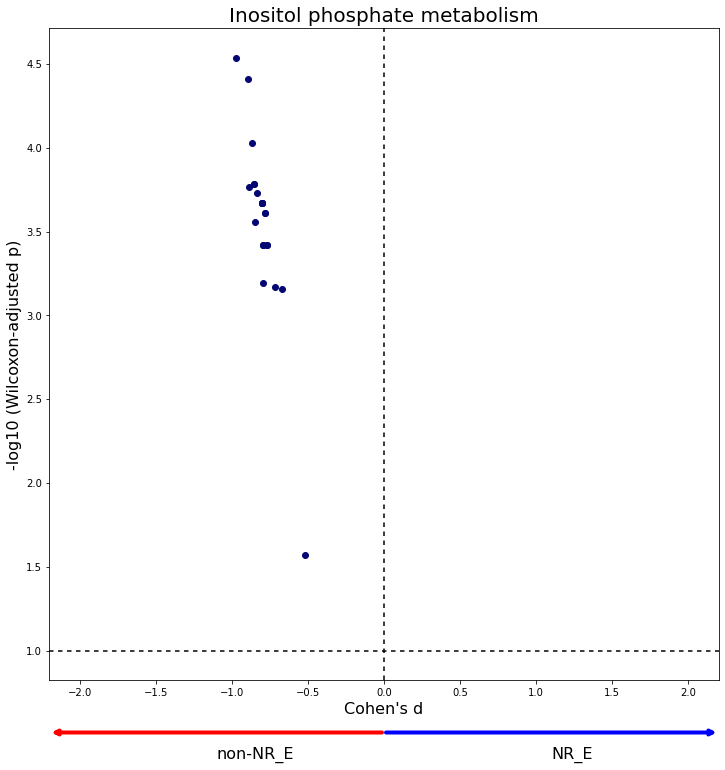

In [36]:
data = W[W['subsystem'] == "Inositol phosphate metabolism"]
plot_differential_scores(data, "Inositol phosphate metabolism", c="#040772")

In [37]:
pd.set_option("display.max_colwidth",1000)

In [38]:
W[W['subsystem'] == "Inositol phosphate metabolism"]

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
INOSTO_pos,2431.0,0.000002,-0.895478,0.000039,INOSTO,inositol oxygenase,1.00 * O2 [c] + 1.00 * myo-inositol [c] --> 1.00 * Water [c] + 1.00 * proton [c] + 1.00 * D-glucuronate [c]\nMIOX,MIOX,Inositol phosphate metabolism,1.13.99.1,4.0
MI1345PP_pos,2655.0,0.000027,-0.799757,0.000215,MI1345PP,"inositol-1,3,4,5-trisphosphate 5-phosphatase","1.00 * Water [c] + 1.00 * 1D-myo-inositol 1,3,4,5-tetrakisphosphate(8-) [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * 1D-myo-inositol 1,3,4-trisphosphate(6-) [c]\nINPP5A; INPP5B; INPP5D; INPP5E; INPP5J; INPPL1; SYNJ1",INPP5A; INPP5B; INPP5D; INPP5E; INPP5J; INPPL1; SYNJ1,Inositol phosphate metabolism,3.1.3.56,4.0
MI134PP_pos,2655.0,0.000027,-0.799757,0.000215,MI134PP,"inositol-1,3,4-trisphosphate 1-phosphatase","1.00 * Water [c] + 1.00 * 1D-myo-inositol 1,3,4-trisphosphate(6-) [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * 1D-myo-Inositol 3,4-bisphosphate [c]\nINPP1",INPP1,Inositol phosphate metabolism,3.1.3.61,4.0
MI145PK_pos,2655.0,0.000027,-0.799757,0.000215,MI145PK,"inositol-1,4,5-trisphosphate 3-kinase","1.00 * ATP [c] + 1.00 * 1D-myo-inositol 1,4,5-trisphosphate(6-) [c] --> 1.00 * ADP [c] + 1.00 * proton [c] + 1.00 * 1D-myo-inositol 1,3,4,5-tetrakisphosphate(8-) [c]\nITPKA; ITPKB; ITPKC",ITPKA; ITPKB; ITPKC,Inositol phosphate metabolism,2.7.1.127,4.0
MI145PP_pos,2742.0,0.000066,-0.797449,0.000381,MI145PP,"inositol-1,4,5-trisphosphate 5-phosphatase","1.00 * Water [c] + 1.00 * 1D-myo-inositol 1,4,5-trisphosphate(6-) [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * (1R,2R,3R,4R,5R,6S)-2,3,5,6-tetrahydroxy-4-(phosphonatooxy)cyclohexyl phosphate [c]\nINPP5A; INPP5B; INPP5D; INPP5E; INPP5J; INPPL1; SYNJ1",INPP5A; INPP5B; INPP5D; INPP5E; INPP5J; INPPL1; SYNJ1,Inositol phosphate metabolism,3.1.3.56,4.0
MI14PP_pos,2740.0,0.000065,-0.769012,0.000380,MI14PP,"inositol-1,4-bisphosphate 1-phosphatase","1.00 * Water [c] + 1.00 * (1R,2R,3R,4R,5R,6S)-2,3,5,6-tetrahydroxy-4-(phosphonatooxy)cyclohexyl phosphate [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * 1D-myo-inositol 4-phosphate(2-) [c]\nINPP1",INPP1,Inositol phosphate metabolism,3.1.3.61,4.0
MI1PP_pos,2675.0,0.000033,-0.779618,0.000244,MI1PP,myo-inositol 1-phosphatase,1.00 * Water [c] + 1.00 * 1D-myo-inositol 1-phosphate(2-) [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * myo-inositol [c]\nIMPA1; IMPA2; MTMR1; MTMR2,IMPA1; IMPA2; MTMR1; MTMR2,Inositol phosphate metabolism,3.1.3.25,4.0
MI1PS_pos,2858.0,0.000204,-0.669766,0.000694,MI1PS,myo-Inositol-1-phosphate synthase,1.00 * D-Glucose 6-phosphate [c] --> 1.00 * 1D-myo-inositol 1-phosphate(2-) [c]\nISYNA1,ISYNA1,Inositol phosphate metabolism,5.5.1.4,4.0
MI34PP_pos,2655.0,0.000027,-0.799757,0.000215,MI34PP,"inositol-3,4-bisphosphate 4-phosphatase","1.00 * Water [c] + 1.00 * 1D-myo-Inositol 3,4-bisphosphate [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * 1D-myo-inositol 3-phosphate(2-) [c]\nINPP4A; INPP4B",INPP4A; INPP4B,Inositol phosphate metabolism,3.1.3.66,4.0
MI3PP_pos,2655.0,0.000027,-0.799757,0.000215,MI3PP,myo-inositol 3-phosphatase,1.00 * Water [c] + 1.00 * 1D-myo-inositol 3-phosphate(2-) [c] --> 1.00 * hydrogenphosphate [c] + 1.00 * myo-inositol [c]\nIMPA1; IMPA2,IMPA1; IMPA2,Inositol phosphate metabolism,3.1.3.25,4.0


# Figure 2E replication

In [39]:
np.unique(W['subsystem'])

array(['Alanine and aspartate metabolism', 'Aminosugar metabolism',
       'Androgen and estrogen synthesis and metabolism',
       'Arachidonic acid metabolism', 'Arginine and Proline Metabolism',
       'Bile acid synthesis', 'Biotin metabolism',
       'Blood group synthesis', 'Butanoate metabolism',
       'Cholesterol metabolism', 'Chondroitin sulfate degradation',
       'Citric acid cycle', 'CoA catabolism', 'CoA synthesis',
       'Cysteine Metabolism', 'Cytochrome metabolism',
       'D-alanine metabolism', 'Eicosanoid metabolism',
       'Fatty acid oxidation', 'Fatty acid synthesis',
       'Folate metabolism', 'Fructose and mannose metabolism',
       'Galactose metabolism', 'Glutamate metabolism',
       'Glutathione metabolism', 'Glycerophospholipid metabolism',
       'Glycine, serine, alanine and threonine metabolism',
       'Glycolysis/gluconeogenesis', 'Glycosphingolipid metabolism',
       'Glyoxylate and dicarboxylate metabolism', 'Heme degradation',
       'Heme s

In [40]:
data = W[~W['subsystem'].isin(["Miscellaneous", "Unassigned"])]

In [41]:
data = data[~data['subsystem'].map(lambda x: "Transport" in x or "Exchange" in x or x == "Other")]

In [42]:
items, counts = np.unique(data['subsystem'], return_counts=True)
counts

array([ 12,  16,   2,   2,  18,  61,   5,  25,   3,  37,  28,  20,   4,
        13,   4,   3,   1,  25, 253,  29,  39,  20,  14,  19,  16,  38,
        25,  40,   2,   6,   2,   3,  24,   6,   5,  23,  60,  41,   3,
        10,  13,  12,  61,  16, 168,   3,   9,   4,  36,   4,  24,  10,
        29,   8,  32,  21,  19,   6,  41,  23,  43,   6,  13,   2,   7,
        19,  37,   1,  32,  45,  14,   2,   7,   1,   2])

In [43]:
items = [items[i] for i in range(len(items)) if counts[i] > 5] #filter(n() > 5) %>%
data = data[data['subsystem'].isin(items)]

In [44]:
data

,wilcox_stat,wilcox_pval,cohens_d,adjusted_pval,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
2HBO_neg,2817.0,0.000138,-0.698512,0.000542,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotinamide adenine dinucleotide [c] --> 1.00 * proton [c] + 1.00 * 2-Oxobutanoate [c] + 1.00 * Nicotinamide adenine dinucleotide - reduced [c]\nLDHA; LDHAL6B; LDHB; LDHC; UEVLD,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
2HBO_pos,3463.0,0.023144,-0.492645,0.037936,2HBO,2-Hydroxybutyrate:NAD+ oxidoreductase,1.00 * 2-Hydroxybutyrate [c] + 1.00 * Nicotinamide adenine dinucleotide [c] --> 1.00 * proton [c] + 1.00 * 2-Oxobutanoate [c] + 1.00 * Nicotinamide adenine dinucleotide - reduced [c]\nLDHA; LDHAL6B; LDHB; LDHC; UEVLD,LDHA; LDHAL6B; LDHB; LDHC; UEVLD,Propanoate metabolism,1.1.1.27,4.0
34DHOXPEGOX_pos,2939.0,0.000431,-0.653060,0.001182,34DHOXPEGOX,"3,4-Dihydroxyphenylethyleneglycol:NAD+ oxidoreductase","1.00 * proton [c] + 1.00 * Nicotinamide adenine dinucleotide - reduced [c] + 1.00 * 3,4-Dihydroxymandelaldehyde [c] --> 1.00 * Nicotinamide adenine dinucleotide [c] + 1.00 * 3,4-Dihydroxyphenylethyleneglycol [c]\nADH1; ADH4; ADH5; ADH6A; ADH7; ADHFE1",ADH1; ADH4; ADH5; ADH6A; ADH7; ADHFE1,Tyrosine metabolism,1.1.1.1,4.0
34DHPLACOX_NADP__neg,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX_NADP_,"3,4-Dihydroxyphenylacetaldehyde:NADP+ oxidoreductase","1.00 * Water [c] + 1.00 * Nicotinamide adenine dinucleotide phosphate [c] + 1.00 * 3,4-Dihydroxyphenylacetaldehyde [c] --> 2.00 * proton [c] + 1.00 * Nicotinamide adenine dinucleotide phosphate - reduced [c] + 1.00 * (3,4-dihydroxyphenyl)acetate [c]\nALDH3A1; ALDH3B1; ALDH3B3",ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
34DHPLACOX_pos,4253.5,0.699304,-0.364959,0.749617,34DHPLACOX,"3,4-Dihydroxyphenylacetaldehyde:NAD+ oxidoreductase","1.00 * Water [c] + 1.00 * Nicotinamide adenine dinucleotide [c] + 1.00 * 3,4-Dihydroxyphenylacetaldehyde [c] --> 2.00 * proton [c] + 1.00 * Nicotinamide adenine dinucleotide - reduced [c] + 1.00 * (3,4-dihydroxyphenyl)acetate [c]\nALDH1A3; ALDH3A1; ALDH3B1; ALDH3B3",ALDH1A3; ALDH3A1; ALDH3B1; ALDH3B3,Tyrosine metabolism,1.2.1.5,4.0
...,...,...,...,...,...,...,...,...,...,...,...
r1449_pos,3571.0,0.044057,-0.357001,0.069448,r1449,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Tetradecanoyl-CoA (n-C14:0CoA) [m] --> 1.00 * Ubiquinol-10 [m] + 1.00 * trans-tetradec-2-enoyl-CoA(4-) [m]\nACOX1; ACOX3,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1450_pos,3574.0,0.044814,-0.356513,0.070453,r1450,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Hexanoyl-CoA [m] --> 1.00 * Ubiquinol-10 [m] + 1.00 * (2E)-Hexenoyl-CoA [m]\nACOX1; ACOX3,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1451_pos,3571.0,0.044057,-0.357001,0.069448,r1451,EC:1.3.3.6,1.00 * ubiquinone-10 [m] + 1.00 * Decanoyl-CoA (n-C10:0CoA) [m] --> 1.00 * Ubiquinol-10 [m] + 1.00 * trans-Dec-2-enoyl-CoA [m]\nACOX1; ACOX3,ACOX1; ACOX3,Fatty acid oxidation,1.3.3.6,0.0
r1487_pos,2979.0,0.000615,-0.633056,0.001567,r1487,EC:6.2.1.3,1.00 * ATP [r] + 1.00 * Coenzyme A [r] + 1.00 * Hexadecenoate (n-C16:1) [r] --> 1.00 * AMP [r] + 1.00 * Diphosphate [r] + 1.00 * palmitoleyl-CoA(4-) [r]\nACSBG2; ACSL1; ACSL3; ACSL4; ACSL5; ACSL6; SLC27A2,ACSBG2; ACSL1; ACSL3; ACSL4; ACSL5; ACSL6; SLC27A2,Fatty acid oxidation,6.2.1.3,0.0


In [45]:
plt.figure(figsize=(12,25), dpi=500)
axs = plt.gca()


#Sorts the reactions for plotting
d = data.groupby('subsystem')['cohens_d'].mean()
axs.scatter(d[d.argsort], d[d.argsort].index, alpha=0)
color = data['cohens_d'].map(lambda x: 'r' if x >= 0 else 'b')
alpha = data['adjusted_pval'].map(lambda x: 1.0 if x < 0.05 else 0.25)
axs.scatter(data['cohens_d'], data['subsystem'], c=color, alpha=alpha)
axs.set_xlabel("Cohen's d", fontsize=30)
axs.tick_params(labelsize=24)

In [46]:
plt.figure(figsize=(12,25), dpi=500)
axs = plt.gca()


#Sorts the reactions for plotting
d = data[data['adjusted_pval'] < 0.05].groupby('subsystem')['cohens_d'].mean()
axs.scatter(d[d.argsort], d[d.argsort].index, alpha=0)
color = data['cohens_d'].map(lambda x: 'r' if x >= 0 else 'b')
alpha = data['adjusted_pval'].map(lambda x: 1.0 if x < 0.05 else 0.25)
axs.scatter(data['cohens_d'], data['subsystem'], c=color, alpha=alpha)
axs.set_xlabel("Cohen's d", fontsize=30)
axs.tick_params(labelsize=24)

In [47]:
plt.figure(figsize=(12,25), dpi=500)
axs = plt.gca()


#Sorts the reactions for plotting
d = data[data['adjusted_pval'] < 0.05].groupby('subsystem')['cohens_d'].median().abs()
axs.scatter(d[d.argsort], d[d.argsort].index, alpha=0)
color = data['cohens_d'].map(lambda x: 'r' if x >= 0 else 'b')
alpha = data['adjusted_pval'].map(lambda x: 1.0 if x < 0.05 else 0.25)
axs.scatter(data['cohens_d'], data['subsystem'], c=color, alpha=alpha)
axs.set_xlabel("Cohen's d", fontsize=30)
axs.tick_params(labelsize=24)